In [1]:
cd /home/mffang/workspace/Poisson-regression

/home/mffang/workspace/Poisson-regression


In [2]:
# Load before numpy to restrict its usage of cores, otherwise it will use all cores when doing @
import os
os.environ["BLAS_NUM_THREADS"] = "1" 
os.environ["OPENBLAS_NUM_THREADS"] = "1" # 

import RADOM
print(RADOM.__version__)

from RADOM.inference import Trajectory
from RADOM.mixtures import PoissonMixture, GammaPoissonMixture
from RADOM.preprocess import *
from RADOM.plotting import *

2023.06.07


In [3]:
from scipy.stats import spearmanr, pearsonr
from scipy.interpolate import UnivariateSpline, RBFInterpolator
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cmasher as cmr
from tqdm import tqdm
import copy

# EDA

!wget -O ./data/neuron_splicing.h5ad https://www.dropbox.com/s/g1afqdcsczgyj2m/neuron_splicing_4_11.h5ad?dl=1

!wget -O ./data/neuron_labeling.h5ad https://www.dropbox.com/s/lk9cl63yd28mfuq/neuron_labeling.h5ad?dl=1

## Load data

In [4]:
neuron_splicing = sc.read('./data/neuron_splicing.h5ad')
neuron_splicing

AnnData object with n_obs × n_vars = 13476 × 44021
    obs: 'cellname'
    var: 'gene_short_name'
    layers: 'spliced', 'unspliced'

In [5]:
neuron_labeling = sc.read('./data/neuron_labeling.h5ad')
neuron_labeling

AnnData object with n_obs × n_vars = 3060 × 24078
    obs: 'cell_type', '4sU', 'treatment', 'time', 'cell_name'
    var: 'gene_short_name', 'activity_genes'
    layers: 'new', 'total'

In [6]:
cell_idx = neuron_labeling.obs_names.isin(neuron_splicing.obs_names)
alldata = neuron_labeling[cell_idx]
gene_idx = neuron_labeling.var_names.isin(neuron_splicing.var_names)
alldata = alldata[:,gene_idx]
alldata

View of AnnData object with n_obs × n_vars = 3060 × 23918
    obs: 'cell_type', '4sU', 'treatment', 'time', 'cell_name'
    var: 'gene_short_name', 'activity_genes'
    layers: 'new', 'total'

In [7]:
cell_idx = np.array([np.where(neuron_splicing.obs_names == cell)[0][0] for cell in alldata.obs_names],dtype=int)
gene_idx = np.array([np.where(neuron_splicing.var_names == gene)[0][0] for gene in alldata.var_names],dtype=int)
alldata.layers['spliced'] = neuron_splicing.layers['spliced'][cell_idx][:,gene_idx].copy()
alldata.layers['unspliced'] = neuron_splicing.layers['unspliced'][cell_idx][:,gene_idx].copy()

In [8]:
alldata.write_h5ad('data/neuron.h5ad')

In [9]:
from sklearn.decomposition import PCA

adata = sc.read('data/neuron.h5ad')
total_UMI = adata.X.toarray().sum(axis=1)
r = total_UMI/np.mean(total_UMI)
pca = PCA(n_components=2)
x = pca.fit_transform(np.log(1+adata.X.toarray()/total_UMI[:,None]*np.mean(total_UMI)))
adata.obsm['X_pca'] = x

/home/mffang/miniconda3/envs/python_3.8/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/mffang/miniconda3/envs/python_3.8/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/mffang/miniconda3/envs/python_3.8/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


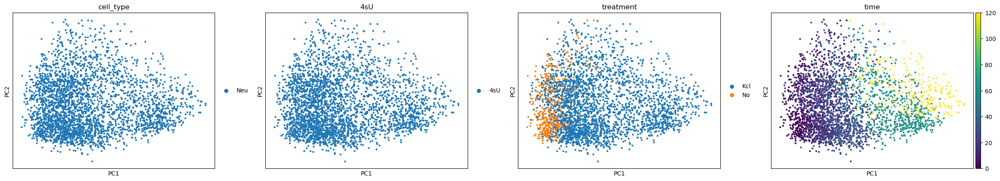

In [10]:
sc.pl.pca(adata,color=['cell_type', '4sU', 'treatment', 'time'])

## Check gene expression

In [11]:
adata.var_names

Index(['0610005C13Rik', '0610006L08Rik', '0610007P14Rik', '0610009B22Rik',
       '0610009E02Rik', '0610009L18Rik', '0610009O20Rik', '0610010F05Rik',
       '0610010K14Rik', '0610012G03Rik',
       ...
       'Zw10', 'Zwilch', 'Zwint', 'Zxdb', 'Zxdc', 'Zyg11a', 'Zyg11b', 'Zyx',
       'Zzef1', 'Zzz3'],
      dtype='object', name='index', length=23918)

/home/mffang/miniconda3/envs/python_3.8/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


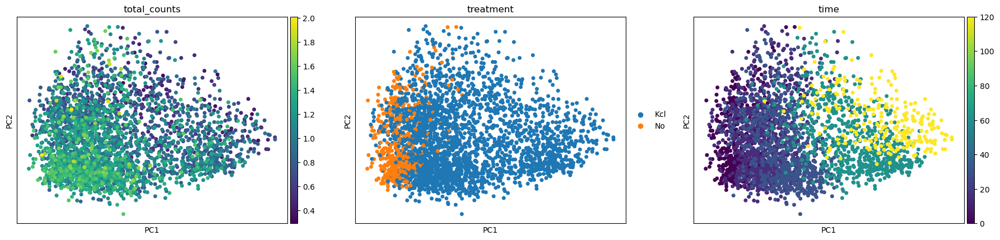

In [12]:
adata.X = adata.layers['new']
adata.obs['total_counts'] = adata.X.mean(1)/adata.X.mean()
sc.pl.pca(adata,color=['total_counts','treatment','time'],s=100)

**scNT fig 3 genes**

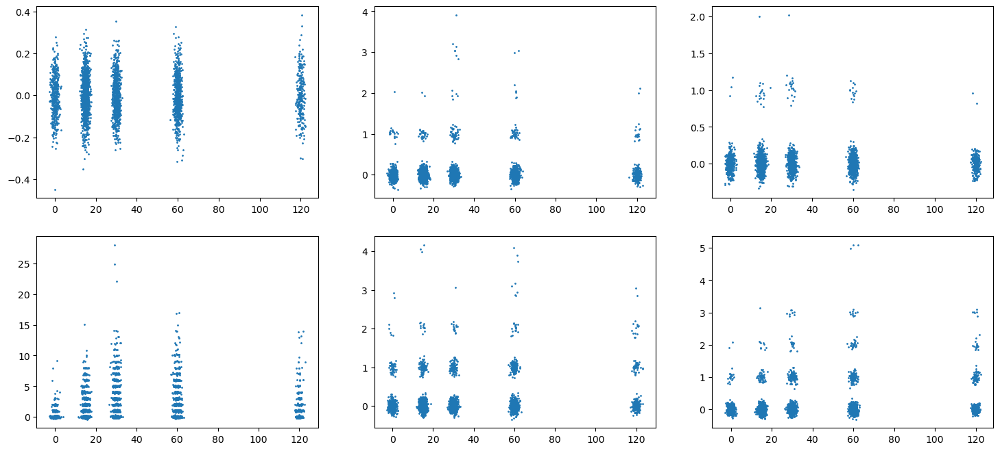

In [13]:
plot_marker_genes = ['Jun','Mef2d','Maff']
fig, ax = plt.subplots(2,3,figsize=(18,8))
for i in range(len(plot_marker_genes)):
    j = np.where(adata.var_names == plot_marker_genes[i])[0][0]
    ax[0,i].scatter(adata.obs.time+np.random.normal(0,1,adata.n_obs),adata.layers['unspliced'].toarray()[:,j]+np.random.normal(0,0.1,adata.n_obs),s=1)
    ax[1,i].scatter(adata.obs.time+np.random.normal(0,1,adata.n_obs),adata.layers['spliced'].toarray()[:,j]+np.random.normal(0,0.1,adata.n_obs),s=1)

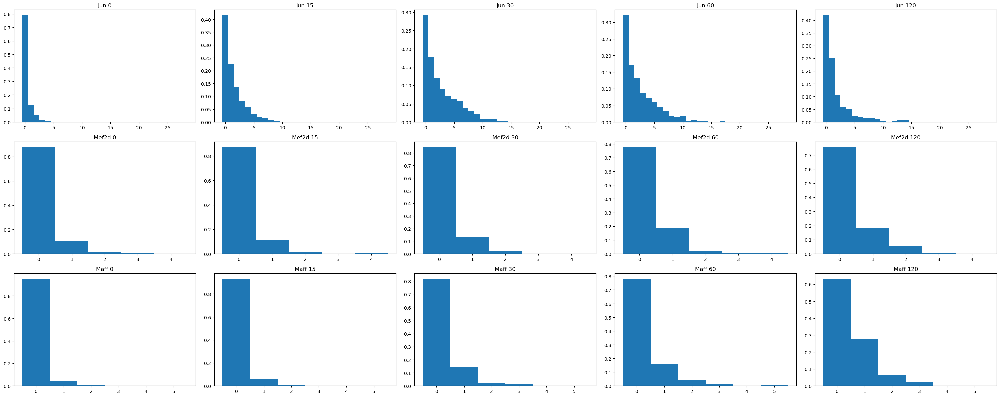

In [14]:
plot_marker_genes = ['Jun','Mef2d','Maff']
fig, ax = plt.subplots(3,5,figsize=(30,12),tight_layout=True)
for i in range(len(plot_marker_genes)):
    j = np.where(adata.var_names == plot_marker_genes[i])[0][0]
    bins = np.arange(-0.5,adata.layers['spliced'].toarray()[:,j].max()+1.5,1)
    for ii,t in enumerate([0, 15, 30, 60, 120]):
        ax[i,ii].hist(adata.layers['spliced'].toarray()[adata.obs.time==t,j],bins=bins,density=True)
        ax[i,ii].set_title(plot_marker_genes[i]+' '+str(t))

In [15]:
IEG = ['Fos', 'Fosb', 'Junb', 'Egr1', 'Nr4a1','Npas4']
LRG = ['Bdnf','Nptx2','Grasp','Igf1','Hdac9']
Fig3G = ['Jun','Mef2d','Maff']
marker_genes = alldata.var_names[alldata.var_names.isin(IEG + LRG + Fig3G + ['Neurod6','Gad1','Dlx1','Dlx2','Nes','Sox2','Aldh1l1','Arc','Npas4', 'c-Fos','Egr1'])]

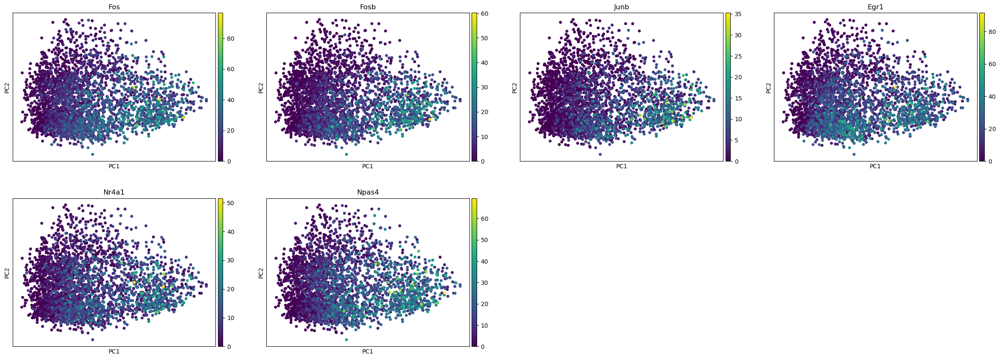

In [17]:
sc.pl.pca(adata,color=IEG,s=100)

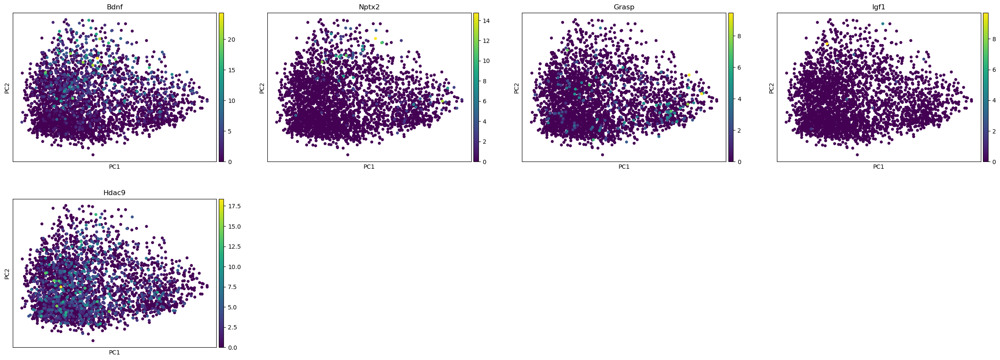

In [18]:
sc.pl.pca(adata,color=LRG,s=100)

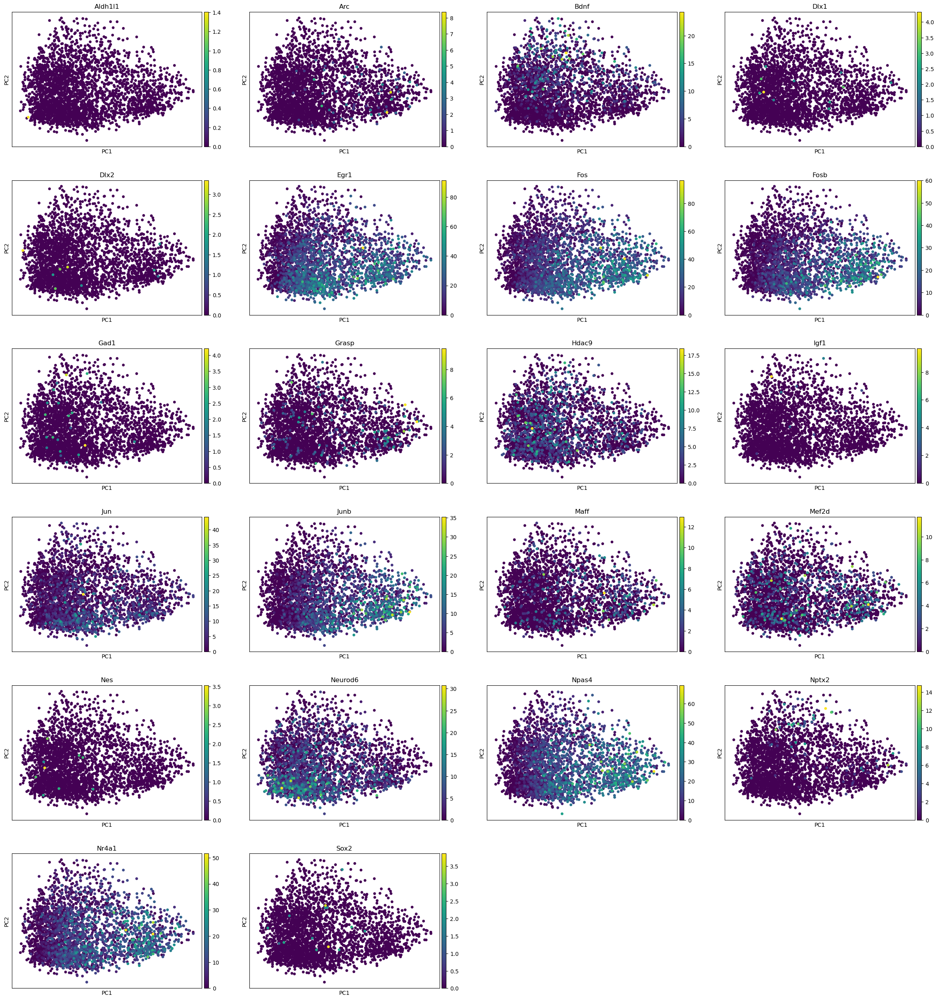

In [19]:
sc.pl.pca(adata,color=marker_genes,s=100)

**Define marker genes and load gene length data**

In [20]:
gene_length_file = np.loadtxt("data/gg_200524_mouse_genome_polyA_cum_1.txt",dtype="str")
gene_length = np.array([int(gene[1]) for gene in gene_length_file])
gene_name = np.array([gene[0] for gene in gene_length_file])
print(np.sum(adata.var_names.isin(gene_name)))

22406


**Define clusters and cell colors**

In [21]:
clusters = adata.obs['time']
set(clusters)

{0, 15, 30, 60, 120}

In [22]:
Clusters = [0,15,30,60,120]

In [23]:
color_palette = ["#f7f7f7","#dfe3ee","#8b9dc3","#3b5998"]
from matplotlib.colors import LinearSegmentedColormap
cmap_cluster = LinearSegmentedColormap.from_list("my_cmap", color_palette, N=len(Clusters))

cell_colors = np.zeros((adata.n_obs,3))

for i,Cluster in enumerate(Clusters):
    idx = clusters.isin([Cluster])
    cell_colors[idx] = cmap_cluster(i)[:3]

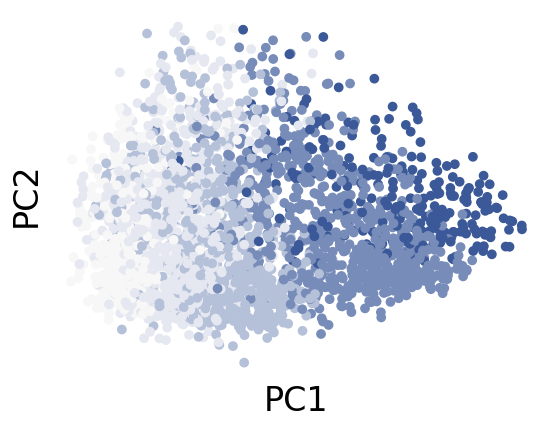

In [24]:
fig, ax = plt.subplots(1,1)
ax.scatter(x[:,0],x[:,1],c=cell_colors);
ax.set_xlabel('PC1',fontsize=24)
ax.set_ylabel('PC2',fontsize=24)
ax.set_frame_on(False)
plt.xticks([]);
plt.yticks([]);

## Gene variances

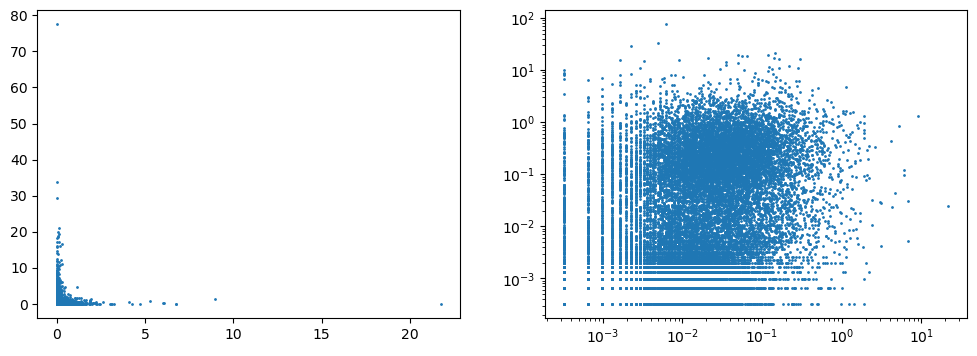

In [25]:
fig, ax = plt.subplots(1,2,figsize=(12,4))
ax[0].scatter(adata.layers['unspliced'].toarray().mean(0),adata.layers['spliced'].toarray().mean(0),s=1)
ax[1].scatter(adata.layers['unspliced'].toarray().mean(0),adata.layers['spliced'].toarray().mean(0),s=1)
ax[1].set_xscale('log')
ax[1].set_yscale('log')

In [26]:
idx = (adata.layers["unspliced"].toarray().mean(0) > 0) 
U = adata.layers["unspliced"][:,idx].toarray()
n,p = U.shape
X = U
X_cov = np.cov(X,rowvar=False)
X_mean = np.mean(X,axis=0)
X_rho = X_cov/X_mean[:,None]/X_mean[None,:]
su = (np.sum(X_rho)-np.sum(np.diag(X_rho)))/((p-1)*p)
print("s estimated by normalized covariance of total U counts =", str(su))


idx = adata.layers["spliced"].toarray().mean(0) > 0
S = adata.layers["spliced"][:,idx].toarray()
n,p = S.shape
X = S
X_cov = np.cov(X,rowvar=False)
X_mean = np.mean(X,axis=0)
X_rho = X_cov/X_mean[:,None]/X_mean[None,:]
ss = (np.sum(X_rho)-np.sum(np.diag(X_rho)))/((p-1)*p)
print("s estimated by normalized covariance of total S counts =", str(ss))

idx = (adata.layers["spliced"].toarray().mean(0) > 0) | (adata.layers["unspliced"].toarray().mean(0) > 0)
U=adata.layers["unspliced"][:,idx].toarray()
S=adata.layers["spliced"][:,idx].toarray()
X = S + U
n,p = X.shape
X_cov = np.cov(X,rowvar=False)
X_mean = np.mean(X,axis=0)
X_rho = X_cov/X_mean[:,None]/X_mean[None,:]
s1 = (np.sum(X_rho)-np.sum(np.diag(X_rho)))/((p-1)*p)
print("s estimated by normalized covariance of total counts =", str(s1))

X = U + S
X_total = X.sum(1)
s2 = (X_total.var()-X_total.mean())/X_total.mean()**2
print("s estimated by total counts =", str(s2))

s estimated by normalized covariance of total U counts = 0.1148553223574574
s estimated by normalized covariance of total S counts = 0.0894457368049688
s estimated by normalized covariance of total counts = 0.09046226774928326
s estimated by total counts = 0.07615544987956668


s estimated by normalized covariance of Poission genes = 0.09782802226128652


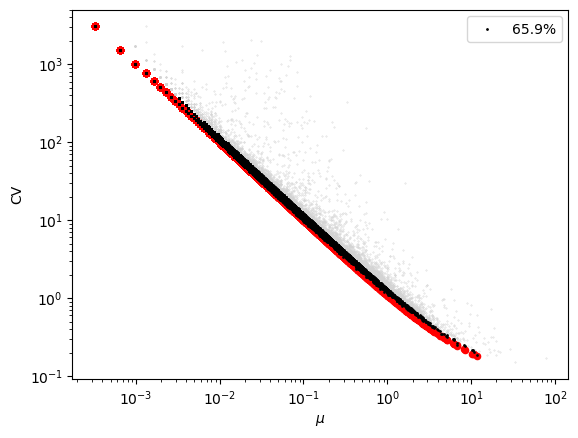

In [27]:
a=1
s=s1

X_bar = np.mean(U + S, axis=0)
X_var = np.var(U + S, axis=0)

Pgene_mask = (X_mean > 0) & (X_var/(a*X_mean + s*X_mean**2) < 1.2)
Pgenes = adata.var_names[idx][Pgene_mask]

P = (S + U)[:,Pgene_mask]
n,p = P.shape
P_cov = np.cov(P,rowvar=False)
P_mean = np.mean(P,axis=0)
P_rho = P_cov/P_mean[:,None]/P_mean[None,:]
s = (np.sum(P_rho)-np.sum(np.diag(P_rho)))/((p-1)*p)
print("s estimated by normalized covariance of Poission genes =", str(s))

plt.scatter(X_bar[Pgene_mask], a/X_bar[Pgene_mask] + s, c='r', s=20)
plt.scatter(X_bar, X_var/X_bar**2,c='lightgray',alpha=1, s=0.1)
plt.scatter(X_bar[Pgene_mask], X_var[Pgene_mask]/X_bar[Pgene_mask]**2,c='k', s=1, label=str(np.around(100*np.sum(Pgene_mask)/len(X_bar),1))+"%")
plt.xlabel(r'$\mu$')
plt.ylabel(r'CV')
plt.xscale('log')
plt.yscale('log')
plt.legend(loc="upper right")

s estimated by normalized covariance of Poission genes = 0.0974457696069147


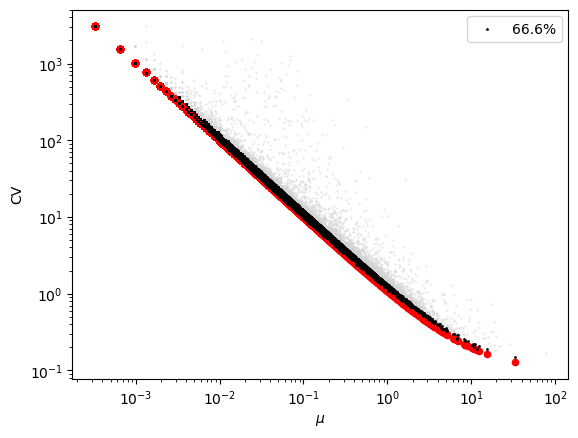

In [28]:
Pgene_mask = (X_mean > 0) & (X_var/(a*X_mean + s*X_mean**2) < 1.2)
Pgenes = adata.var_names[idx][Pgene_mask]

P = (S + U)[:,Pgene_mask]
n,p = P.shape
P_cov = np.cov(P,rowvar=False)
P_mean = np.mean(P,axis=0)
P_rho = P_cov/P_mean[:,None]/P_mean[None,:]
s = (np.sum(P_rho)-np.sum(np.diag(P_rho)))/((p-1)*p)
print("s estimated by normalized covariance of Poission genes =", str(s))

plt.scatter(X_bar[Pgene_mask], a/X_bar[Pgene_mask] + s, c='r', s=20)
plt.scatter(X_bar, X_var/X_bar**2,c='lightgray',alpha=1, s=0.1)
plt.scatter(X_bar[Pgene_mask], X_var[Pgene_mask]/X_bar[Pgene_mask]**2,c='k', s=1, label=str(np.around(100*np.sum(Pgene_mask)/len(X_bar),1))+"%")
plt.xlabel(r'$\mu$')
plt.ylabel(r'CV')
plt.xscale('log')
plt.yscale('log')
plt.legend(loc="upper right")

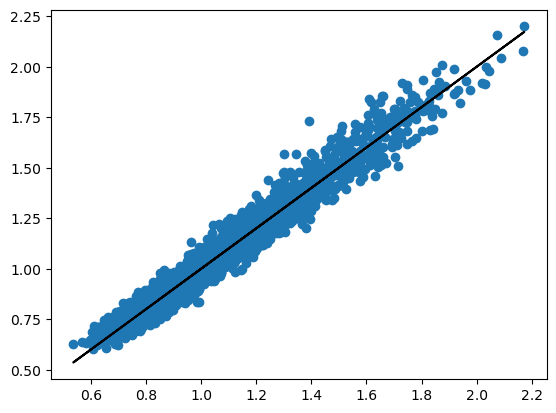

In [29]:
read_depth =  (U + S)[:,Pgene_mask].sum(1)
rd = read_depth/read_depth.mean()

XX = U + S
plt.figure()
plt.plot(rd,rd,'k')
plt.scatter(rd,XX.mean(1)/XX.mean())

## Select genes

In [39]:
var_threshold = 1.2
U_mean = adata.layers["unspliced"].toarray().mean(0)
S_mean = adata.layers["spliced"].toarray().mean(0)
U_var = adata.layers["unspliced"].toarray().var(0)
S_var = adata.layers["spliced"].toarray().var(0)
fitted_idx = (U_mean > 0.1) & (S_mean > 0.1) \
    & (U_var/(a*U_mean + su*U_mean**2) > var_threshold) \
    & (S_var/(a*S_mean + ss*S_mean**2) > var_threshold)  
fitted_genes=adata.var_names[fitted_idx]
len(fitted_genes)

/tmp/ipykernel_3279734/3491205595.py:7: RuntimeWarning: invalid value encountered in divide
  & (U_var/(a*U_mean + su*U_mean**2) > var_threshold) \
/tmp/ipykernel_3279734/3491205595.py:8: RuntimeWarning: invalid value encountered in divide
  & (S_var/(a*S_mean + ss*S_mean**2) > var_threshold)


377

In [40]:
cell_cycle_genes = np.loadtxt("data/cell_cycle_genes.txt",dtype="str")
fitted_genes = fitted_genes[~fitted_genes.isin(cell_cycle_genes)]
len(fitted_genes)

344

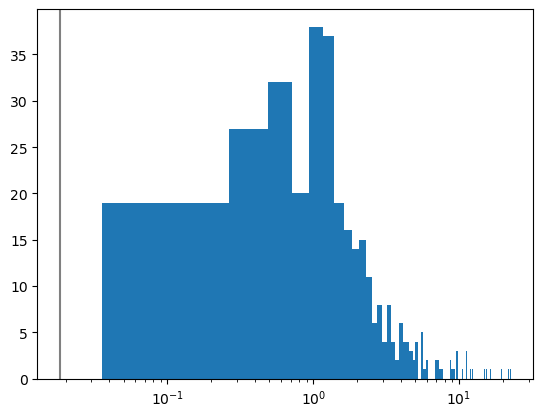

In [41]:
fitted_genes = fitted_genes[fitted_genes.isin(gene_name)]
fitted_idx = adata.var_names.isin(fitted_genes)

Ub_gene_idx = np.array([ np.where(gene_name == fitted_gene)[0][0]  for fitted_gene in fitted_genes ],dtype=int)
Ub = 10**(-5)*gene_length[Ub_gene_idx]
plt.hist(Ub,bins=100);
plt.xscale('log')
plt.axvline(x=np.e**(-4),color='gray');

In [42]:
plot_idx = [np.where(fitted_genes==gene)[0] for gene in marker_genes]
plot_idx = np.concatenate(plot_idx).ravel()
if plot_idx.sum() == 0:
    plot_idx = np.arange(10)
else:
    print(fitted_genes[plot_idx])

Index(['Hdac9'], dtype='object', name='index')


/tmp/ipykernel_3279734/1360315791.py:2: RuntimeWarning: divide by zero encountered in divide
  ax[0].scatter(S_mean, a/S_mean + s, c='r', s=20)
/tmp/ipykernel_3279734/1360315791.py:3: RuntimeWarning: invalid value encountered in divide
  ax[0].scatter(S_mean, S_var/S_mean**2,c='lightgray',alpha=1, s=1)
/tmp/ipykernel_3279734/1360315791.py:7: RuntimeWarning: divide by zero encountered in divide
  ax[1].scatter(U_mean, a/U_mean + s, c='r', s=20)
/tmp/ipykernel_3279734/1360315791.py:8: RuntimeWarning: invalid value encountered in divide
  ax[1].scatter(U_mean, U_var/U_mean**2,c='lightgray',alpha=1, s=1)


(3060, 336, 2)

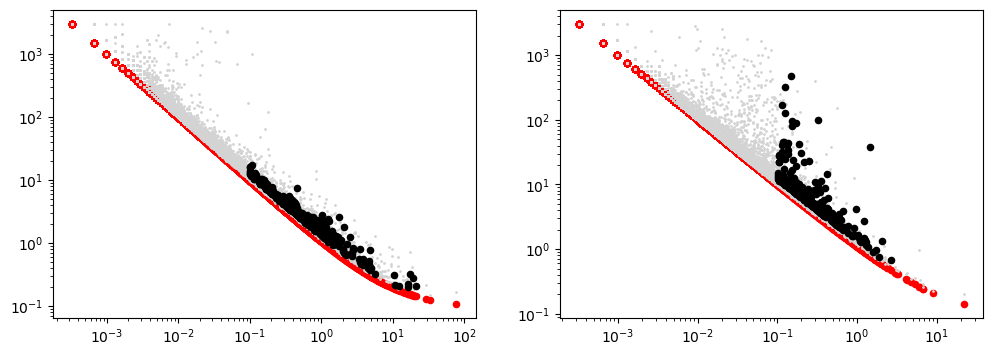

In [43]:
fig, ax = plt.subplots(1,2,figsize=(12,4))
ax[0].scatter(S_mean, a/S_mean + s, c='r', s=20)
ax[0].scatter(S_mean, S_var/S_mean**2,c='lightgray',alpha=1, s=1)
ax[0].scatter(S_mean[fitted_idx], S_var[fitted_idx]/S_mean[fitted_idx]**2, c='k', s=20)
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[1].scatter(U_mean, a/U_mean + s, c='r', s=20)
ax[1].scatter(U_mean, U_var/U_mean**2,c='lightgray',alpha=1, s=1)
ax[1].scatter(U_mean[fitted_idx], U_var[fitted_idx]/U_mean[fitted_idx]**2, c='k', s=20)
ax[1].set_xscale('log')
ax[1].set_yscale('log')

X=np.zeros((n,fitted_idx.sum(),2))
X[:,:,0]=adata.layers["unspliced"][:,fitted_idx].toarray()
X[:,:,1]=adata.layers["spliced"][:,fitted_idx].toarray()
fitted_genes=adata.var_names[fitted_idx]
X.shape

In [45]:
fitted_genes

Index(['1810013L24Rik', '4930402H24Rik', '5031425E22Rik', '9130024F11Rik',
       '9330182L06Rik', 'Aatf', 'Abcc5', 'Ablim2', 'Acap2', 'Acot7',
       ...
       'Wnk2', 'Xpo7', 'Yars', 'Ywhag', 'Ywhah', 'Zc3h7a', 'Zeb2', 'Zfp148',
       'Zfp277', 'Zfp462'],
      dtype='object', name='index', length=336)

## Mixtures fitting

In [46]:
cell_idx = clusters.isin(Clusters)
X_mix = X[cell_idx]

1 -598.545783286178 -598.7653911293153 -599.4270882487604
2 -593.7261660327331 -594.1657085163932 -595.4900874236159
3 -589.0430127700797 -589.7024898942627 -591.689550589263
4 -586.7158986422372 -587.5953104069431 -590.245052889721
5 -584.6239843717799 -585.7233307770086 -589.0357550475642
6 -583.808627361317 -585.1279084070686 -589.1030144654018


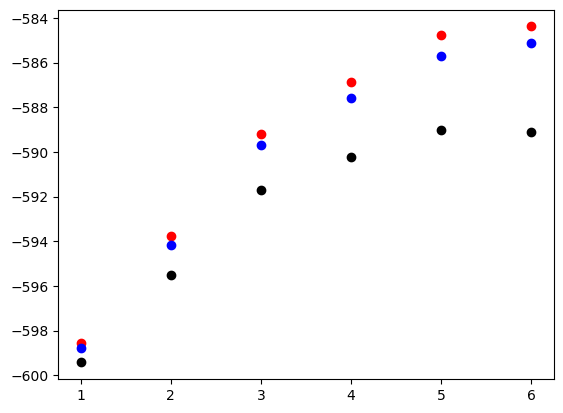

In [49]:
PMs = []
for nc in range(1,7):
    PM = PoissonMixture(n_components=nc,verbose=0)
    Q, elbo = PM.fit(X_mix,warm_start=False,read_depth=rd,epoch=5,n_init=3)
    PMs.append(PM)
    plt.scatter(nc,elbo,color='r')
    plt.scatter(nc,PM.compute_AIC(X_mix),color='b')
    plt.scatter(nc,PM.compute_BIC(X_mix),color='k')
    print(nc,PM.compute_lower_bound(X_mix),PM.compute_AIC(X_mix),PM.compute_BIC(X_mix))

array([0.33161071, 0.66838929])

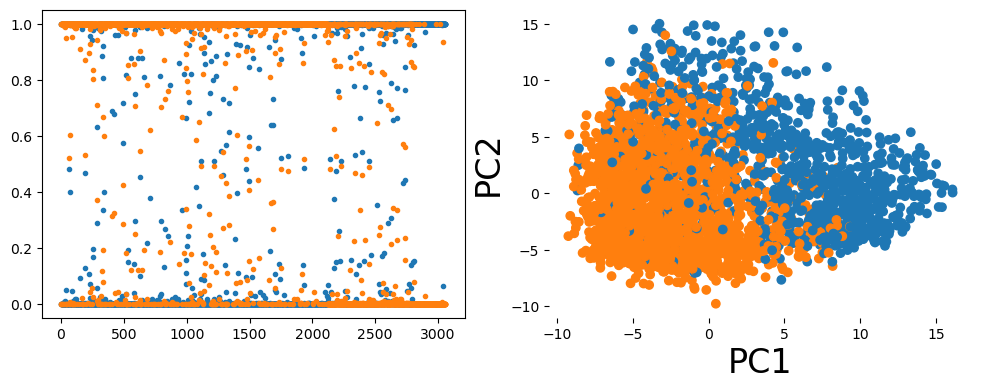

In [50]:
PM = PoissonMixture(n_components=2,verbose=0)
Q, elbo = PM.fit(X_mix,warm_start=False,read_depth=rd,epoch=10,n_init=5)
tab_colors = plt.cm.tab10(np.arange(10))
fig, ax = plt.subplots(1,2,figsize=(12,4))
ax[0].plot(Q[np.argsort(clusters[cell_idx])],'.');
ax[1].scatter(x[:,0],x[:,1],c=tab_colors[np.argmax(Q,axis=1)]);
ax[1].set_xlabel('PC1',fontsize=24)
ax[1].set_ylabel('PC2',fontsize=24)
ax[1].set_frame_on(False)
PM.weights

array([0.3688198 , 0.42765184, 0.20352836])

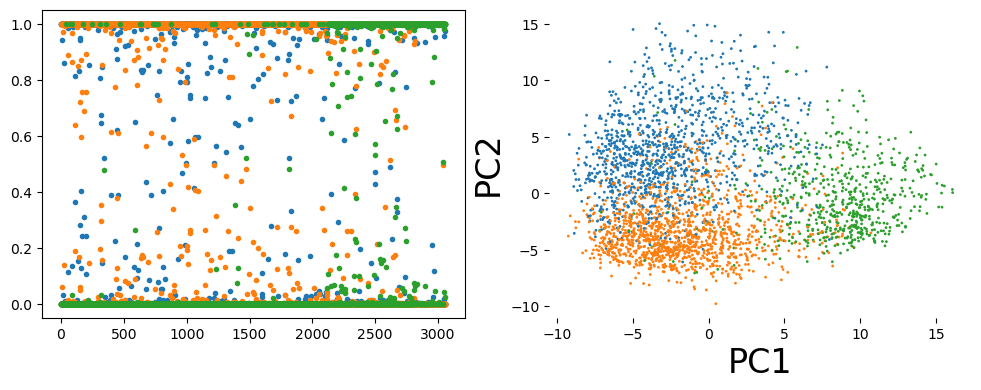

In [51]:
PM = PoissonMixture(n_components=3,verbose=0)
Q, elbo = PM.fit(X_mix,warm_start=False,read_depth=rd,epoch=10,n_init=5)
tab_colors = plt.cm.tab10(np.arange(10))
fig, ax = plt.subplots(1,2,figsize=(12,4))
ax[0].plot(Q[np.argsort(clusters[cell_idx])],'.');
ax[1].scatter(x[:,0],x[:,1],c=tab_colors[np.argmax(Q,axis=1)],s=1);
ax[1].set_xlabel('PC1',fontsize=24)
ax[1].set_ylabel('PC2',fontsize=24)
ax[1].set_frame_on(False)
PM.weights

array([0.1589192 , 0.19650698, 0.33624322, 0.30833059])

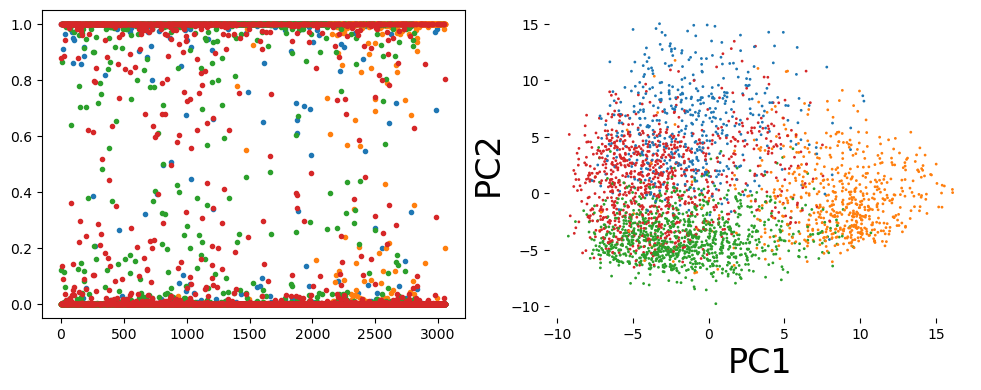

In [52]:
PM = PoissonMixture(n_components=4,verbose=0)
Q, elbo = PM.fit(X_mix,warm_start=False,read_depth=rd,epoch=10,n_init=5)
tab_colors = plt.cm.tab10(np.arange(10))
fig, ax = plt.subplots(1,2,figsize=(12,4))
ax[0].plot(Q[np.argsort(clusters[cell_idx])],'.');
ax[1].scatter(x[:,0],x[:,1],c=tab_colors[np.argmax(Q,axis=1)],s=1);
ax[1].set_xlabel('PC1',fontsize=24)
ax[1].set_ylabel('PC2',fontsize=24)
ax[1].set_frame_on(False)
PM.weights

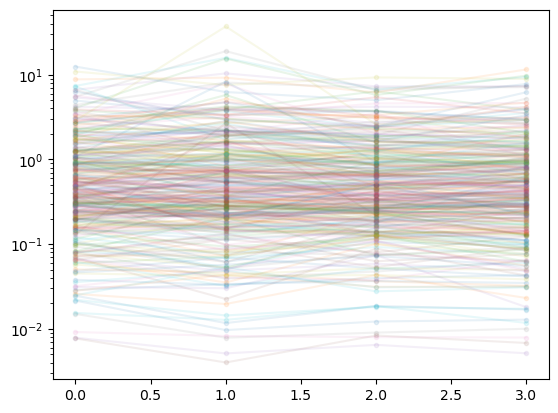

In [53]:
gbr = PM.theta[:,:,0]/PM.theta[:,:,1]

plt.plot(gbr,'.-',alpha=0.1);
plt.yscale('log')

# Trajectory fitting

In [54]:
elbos = {}
traj_params={'r':rd,"lambda_tau":0,"lambda_a":0}
traj_params_Ub={'r':rd,"Ub":Ub,"lambda_tau":0,"lambda_a":0}

x_pca = adata.obsm['X_pca']
x = x_pca

## Fixed time

In [55]:
m=121
weight0 = np.zeros((adata.n_obs,m))
for i,Cluster in enumerate(Clusters):
    idx = clusters.isin([Cluster])
    weight0[idx,int(Cluster)] += 1
weight0=weight0/weight0.sum(axis=1,keepdims=True)
#plt.scatter(np.sum(t_grids[None,:]*weight0,axis=1),s,c=colors20[np.mod(clusters, 20)]);
Q0 = weight0[:,None]

In [56]:
topo = np.array([[0,1,2]])
tau = (0,1,2) # ~2 hours
traj = Trajectory(topo, tau, model="two_species_ss",verbose=1)
traj = traj.fit(X,warm_start=True,fit_tau=True,params=traj_params_Ub,Q=Q0,prior=Q0,parallel=True,n_threads=10,epoch=100)
print(traj.elbos[-1])

fitting with warm start


  0%|          | 0/100 [00:00<?, ?it/s]/home/mffang/workspace/Poisson-regression/RADOM/inference.py:162: RuntimeWarning: divide by zero encountered in log
  logL += np.log(self.weights)
 10%|█         | 10/100 [00:11<01:40,  1.12s/it]/home/mffang/workspace/Poisson-regression/RADOM/inference.py:226: RuntimeWarning: divide by zero encountered in log
  logL += np.log(self.weights)
100%|██████████| 100/100 [03:19<00:00,  1.99s/it]

-597.7076979156185


In [57]:
traj_fix = copy.deepcopy(traj)

[0.00000000e+00 6.14225222e-04 2.00000000e+00]


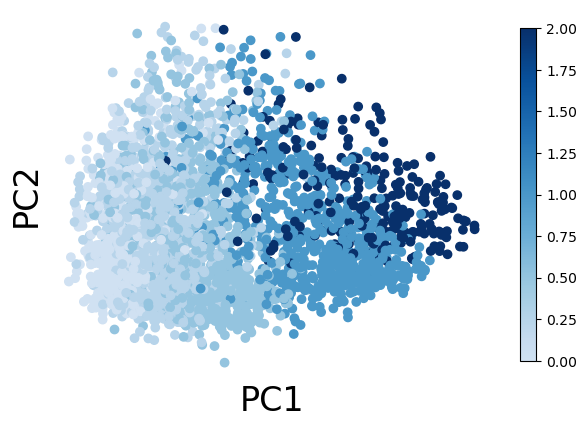

In [58]:
print(traj.tau)
cmap_y = cmr.get_sub_cmap('Blues', 0.2, 1)
fig, ax = plt.subplots(1,1)
im=ax.scatter(x[:,0],x[:,1],c=traj.Q[:,0]@traj.t,cmap=cmap_y);
ax.set_xlabel('PC1',fontsize=24)
ax.set_ylabel('PC2',fontsize=24)
ax.set_frame_on(False)
plt.xticks([]);
plt.yticks([]);
plt.colorbar(im,fraction=0.05, shrink =0.9) # adding the colobar on the right

0.0
0.25
0.5
1.0
2.0


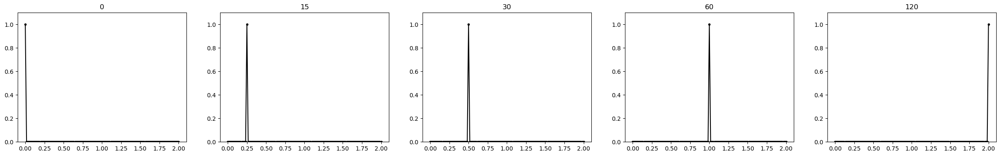

In [59]:
fig, ax = plt.subplots(1,len(Clusters),figsize=(6*len(Clusters),4))
for i,stage in enumerate(Clusters):
    idx = clusters.isin([stage])
    ax[i].plot(traj.t,traj.Q[idx,0].mean(0),'k.-')
    ax[i].set_title(stage)
    ax[i].set_ylim((0,1.1))
    print((traj.Q[idx,0]@traj.t).mean())

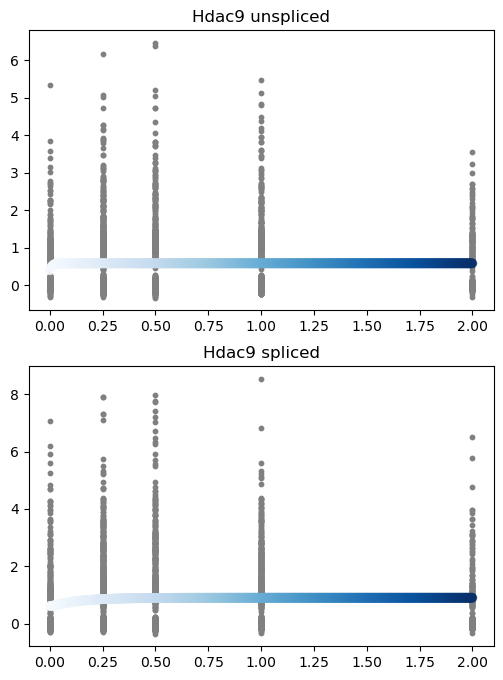

In [60]:
plot_y(traj,X=X/rd[:,None,None],idx=plot_idx,gene_name=fitted_genes);

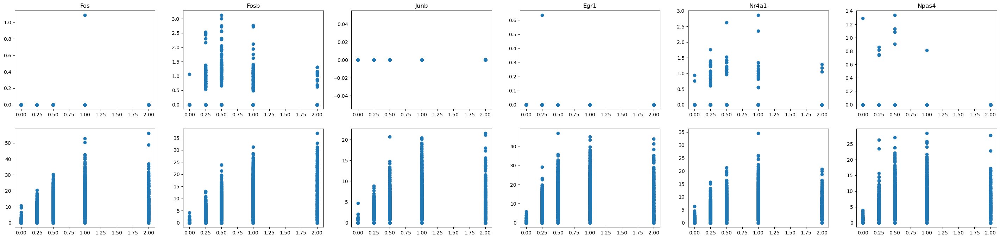

In [61]:
plot_marker_genes = IEG
fig,ax = plt.subplots(2,len(plot_marker_genes),figsize=(6*len(plot_marker_genes),8))
for i,gene in enumerate(plot_marker_genes):
    j = np.where(adata.var_names == gene)[0][0]
    ax[0,i].set_title(gene)
    ax[0,i].scatter(traj.Q[:,0]@traj.t,adata.layers["unspliced"].toarray()[:,j]/rd)
    ax[1,i].scatter(traj.Q[:,0]@traj.t,adata.layers["spliced"].toarray()[:,j]/rd)

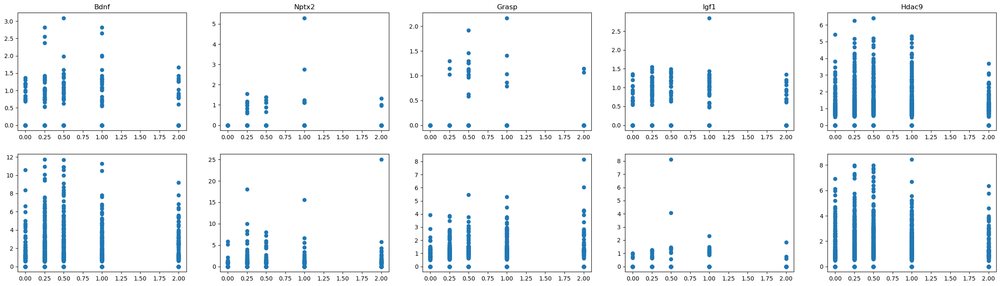

In [62]:
plot_marker_genes = LRG
fig,ax = plt.subplots(2,len(plot_marker_genes),figsize=(6*len(plot_marker_genes),8))
for i,gene in enumerate(plot_marker_genes):
    j = np.where(adata.var_names == gene)[0][0]
    ax[0,i].set_title(gene)
    ax[0,i].scatter(traj.Q[:,0]@traj.t,adata.layers["unspliced"].toarray()[:,j]/rd)
    ax[1,i].scatter(traj.Q[:,0]@traj.t,adata.layers["spliced"].toarray()[:,j]/rd)

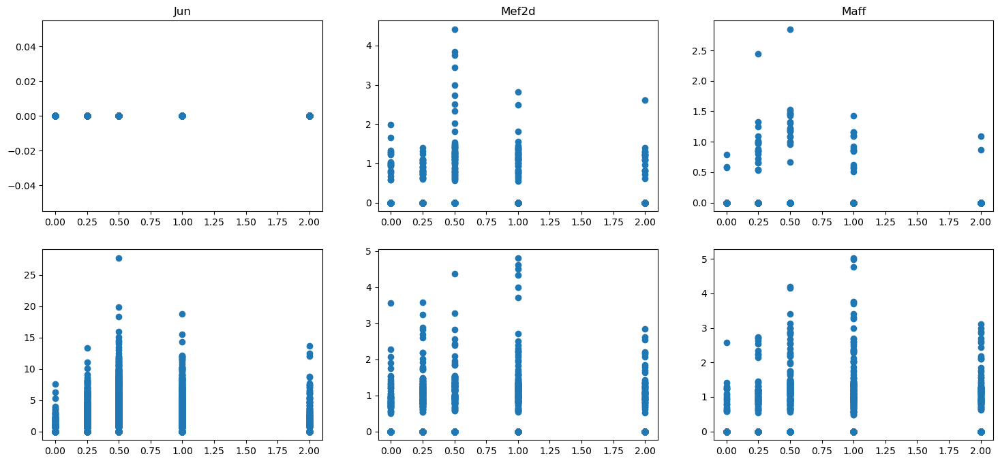

In [63]:
plot_marker_genes = ['Jun','Mef2d','Maff']
fig,ax = plt.subplots(2,len(plot_marker_genes),figsize=(6*len(plot_marker_genes),8))
for i,gene in enumerate(plot_marker_genes):
    j = np.where(adata.var_names == gene)[0][0]
    ax[0,i].set_title(gene)
    ax[0,i].scatter(traj.Q[:,0]@traj.t,adata.layers["unspliced"].toarray()[:,j]/rd)
    ax[1,i].scatter(traj.Q[:,0]@traj.t,adata.layers["spliced"].toarray()[:,j]/rd)

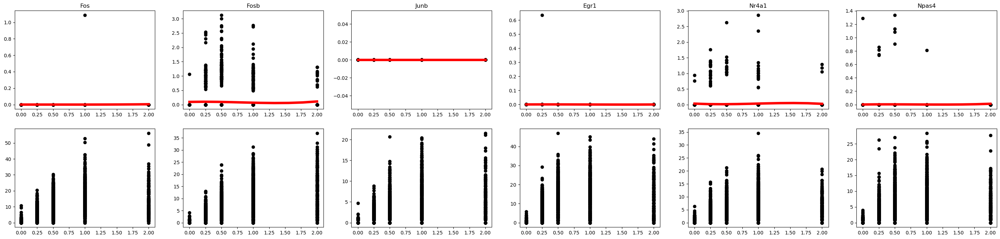

In [64]:
plot_marker_genes = IEG

t_hat = traj.Q[:,0]@traj.t
cell_order = np.argsort(t_hat)
x = t_hat[cell_order]
x_smooth = np.linspace(x.min(), x.max(), num=10)  # Generate a uniform grid for plotting    
    
fig,ax = plt.subplots(2,len(plot_marker_genes),figsize=(6*len(plot_marker_genes),8))
for i in range(len(plot_marker_genes)):
    j = np.where(adata.var_names == plot_marker_genes[i])[0][0]
    y = adata.layers["unspliced"].toarray()[:,j]
    u_spline = UnivariateSpline(x, y, s=len(x)*1)
    y_smooth = u_spline(x_smooth)
    ax[0,i].plot(x_smooth, y_smooth, label='Smoothed Function',c='r',linewidth=5)
    ax[0,i].set_title(plot_marker_genes[i])
    ax[0,i].scatter(traj.Q[:,0]@traj.t,adata.layers["unspliced"].toarray()[:,j]/rd,color='k')
    
    z = adata.layers["spliced"].toarray()[:,j]
    s_spline = UnivariateSpline(x, z, s=len(x)*10)
    z_smooth = s_spline(x_smooth)
    ax[1,i].scatter(traj.Q[:,0]@traj.t,adata.layers["spliced"].toarray()[:,j]/rd,color='k')
    ax[1,i].plot(x_smooth, z_smooth, label='Smoothed Function',c='r',linewidth=5)

## Fine cluster

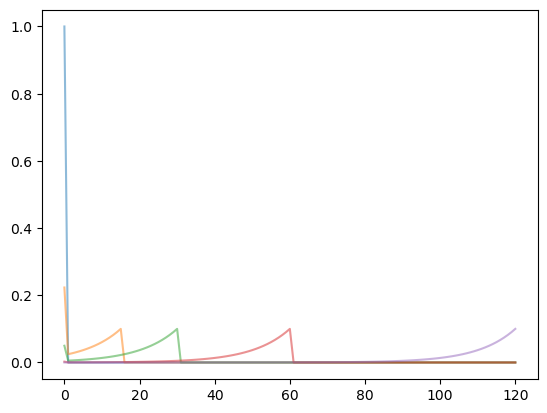

In [94]:
m=121
k=0.1
weight0 = np.zeros((adata.n_obs,m))
for i,Cluster in enumerate(Clusters):
    idx = clusters.isin([Cluster])
    weight0[idx,:int(Cluster)+1] = np.exp(-k*np.arange(int(Cluster),-1,-1))*k
    weight0[idx,0] = np.exp(-k*int(Cluster))
    plt.plot(weight0[idx,:][0,:],alpha=0.5)
weight0=weight0/weight0.sum(axis=1,keepdims=True)
Q0 = weight0[:,None]

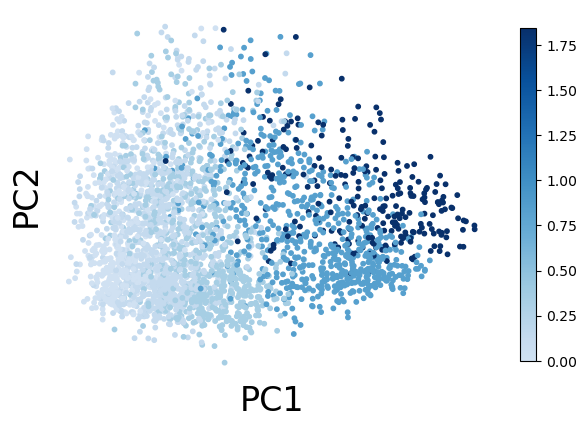

In [95]:
cmap_y = cmr.get_sub_cmap('Blues', 0.2, 1)
fig, ax = plt.subplots(1,1)
im=ax.scatter(x_pca[:,0],x_pca[:,1],c=(Q0.sum(1))@(np.linspace(0,2,m).reshape((-1,1))),cmap=cmap_y,s=10);
ax.set_xlabel('PC1',fontsize=24)
ax.set_ylabel('PC2',fontsize=24)
ax.set_frame_on(False)
plt.xticks([]);
plt.yticks([]);
plt.colorbar(im,fraction=0.05, shrink =0.9) # adding the colobar on the right

In [141]:
topo = np.array([[0,1,2]])
tau = (0,1,2) # ~2 hours
traj = Trajectory(topo, tau, model="two_species_ss",verbose=1)
traj = traj.fit(X,warm_start=True,fit_tau=True,params=traj_params,Q=Q0,parallel=True,n_threads=10,epoch=100)
print(traj.elbos[-1])
traj_ws = copy.deepcopy(traj)

fitting with warm start


100%|██████████| 100/100 [04:00<00:00,  2.41s/it]

-589.4400039156302


In [98]:
topo = np.array([[0,1,2]])
tau = (0,1,2) # ~2 hours
traj = Trajectory(topo, tau, model="two_species_ss",verbose=1)
traj = traj.fit(X,warm_start=True,fit_tau=True,params=traj_params_Ub,Q=Q0,parallel=True,n_threads=10,epoch=100)
print(traj.elbos[-1])

fitting with warm start


100%|██████████| 100/100 [04:01<00:00,  2.42s/it]


-589.4760263004855


In [149]:
topo = np.array([[0,1,2]])
tau = (0,1,2) # ~2 hours
traj = Trajectory(topo, tau, model="two_species_ss",verbose=1)
traj = traj.fit(X,warm_start=True,fit_tau=True,params=traj_params,Q=Q0,prior=Q0,parallel=True,n_threads=10,epoch=100)
print(traj.elbos[-1])
traj_prior = copy.deepcopy(traj)

fitting with warm start


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


-590.6840803654932


In [150]:
traj = traj_prior

[0.         0.73293068 2.        ]


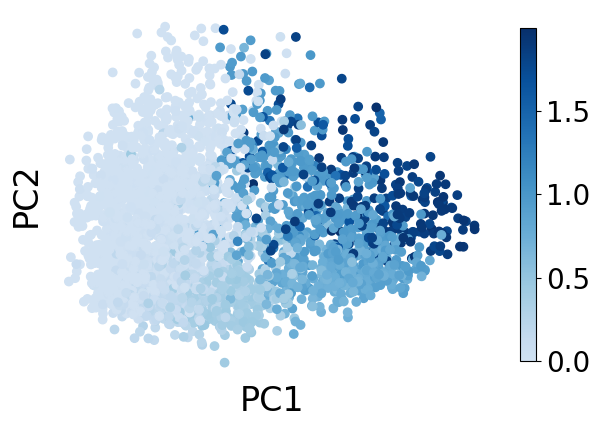

In [151]:
print(traj.tau)
cmap_y = cmr.get_sub_cmap('Blues', 0.2, 1)
fig, ax = plt.subplots(1,1)
im=ax.scatter(x_pca[:,0],x_pca[:,1],c=traj.Q[:,0]@traj.t,cmap=cmap_y);
ax.set_xlabel('PC1',fontsize=24)
ax.set_ylabel('PC2',fontsize=24)
ax.set_frame_on(False)
plt.xticks([]);
plt.yticks([]);
plt.colorbar(im,fraction=0.05, shrink =0.9) # adding the colobar on the right

[]

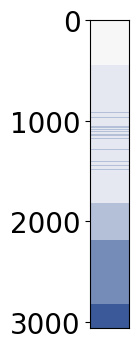

In [152]:
order = np.argsort(traj.Q[:,0]@traj.t)
cluster = np.zeros(adata.n_obs)
for i,Cluster in enumerate(Clusters):
    idx = clusters.isin([Cluster])
    cluster[idx] = i
#plt.scatter(np.sum(t_grids[None,:]*weight0,axis=1),s,c=colors20[np.mod(clusters, 20)]);
fig, ax = plt.subplots(1,1,figsize=(0.5,4))
ax.imshow(cluster[order,None],aspect="auto",cmap=cmap_cluster)
ax.set_xticks([])

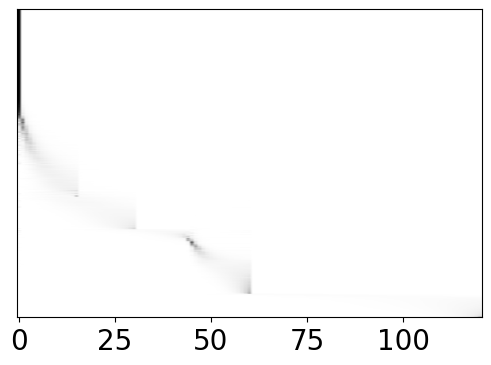

In [153]:
fig, ax = plt.subplots(1,1,figsize=(6,4))
ax=plot_t(traj,l=0,ax=ax,order_cells=True)
ax.set_yticks([]);

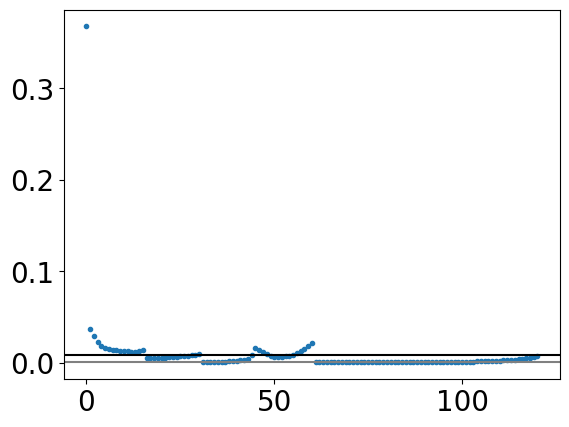

In [154]:
plt.plot(traj.Q[:,0].mean(0),'.')
plt.axhline(y=1/traj.m,c='k')
plt.axhline(y=0.1/traj.m,c='gray')

445 0.0
953 0.05850832247567745
719 0.19289579896944994
693 0.7765196761798151
250 1.7022224752452044


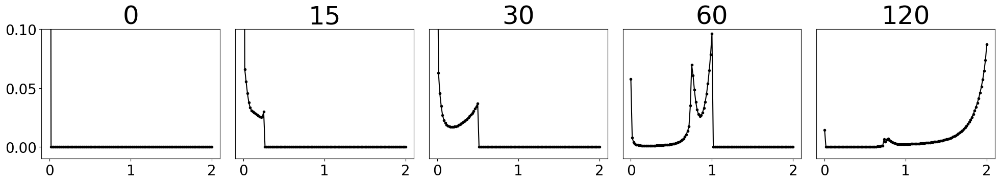

In [155]:
plt.rcParams['font.size'] = '20'
label_font = '36'
fig, ax = plt.subplots(1,len(Clusters),figsize=(4*len(Clusters),4),tight_layout=True)
for i,stage in enumerate(Clusters):
    idx = clusters.isin([stage])
    ax[i].plot(traj.t,traj.Q[idx,0].mean(0),'.-',color='k')
    ax[i].set_title(stage,fontsize=label_font)
    ax[i].set_ylim([-0.01,0.1])
    if i!=0:
        ax[i].set_yticks([])
    print(idx.sum(),(traj.Q[idx,0]@traj.t).mean())

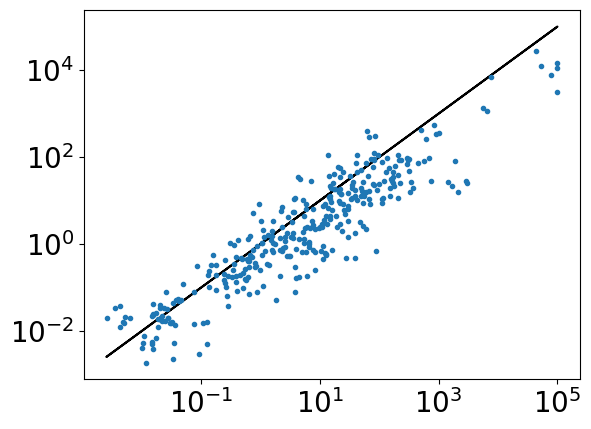

In [156]:
plt.loglog(traj.theta[:,[-2]],traj.theta[:,[-2]],'k');
plt.loglog(traj.theta[:,[-2]],traj.theta[:,[-1]],'.');

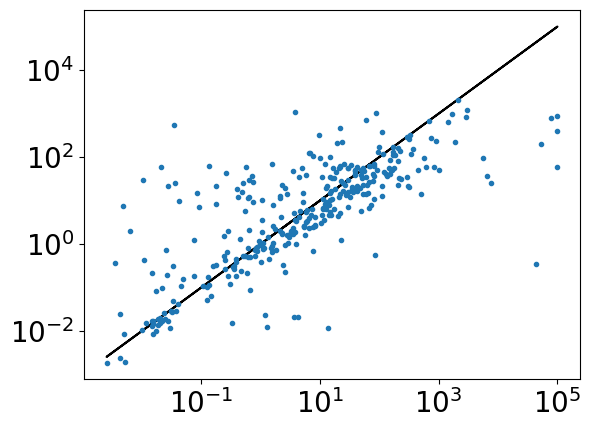

In [157]:
plt.loglog(traj_prior.theta[:,[-2]],traj_prior.theta[:,[-2]],'k');
plt.loglog(traj_prior.theta[:,[-2]],traj_ws.theta[:,[-2]],'.');

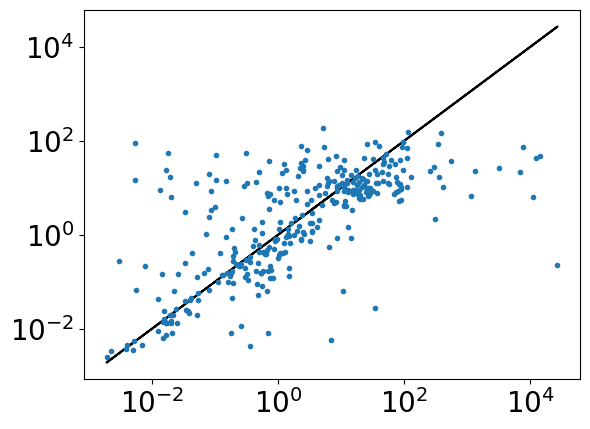

In [158]:
plt.loglog(traj_prior.theta[:,[-1]],traj_prior.theta[:,[-1]],'k');
plt.loglog(traj_prior.theta[:,[-1]],traj_ws.theta[:,[-1]],'.');

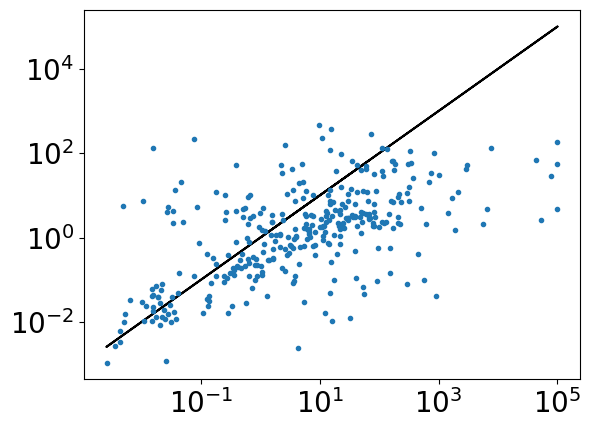

In [159]:
plt.loglog(traj.theta[:,[-2]],traj.theta[:,[-2]],'k');
plt.loglog(traj.theta[:,[-2]],traj_fix.theta[:,[-2]],'.');

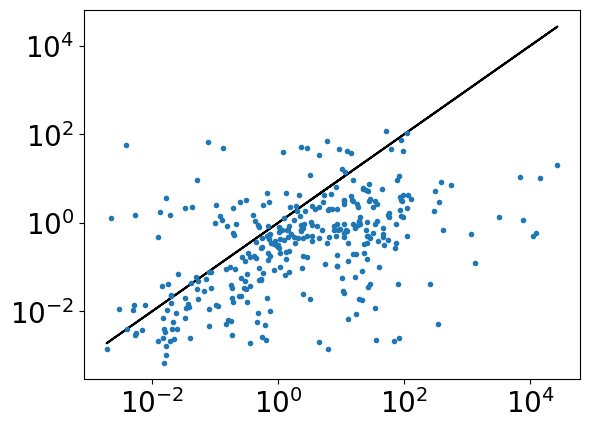

In [160]:
plt.loglog(traj.theta[:,[-1]],traj.theta[:,[-1]],'k');
plt.loglog(traj.theta[:,[-1]],traj_fix.theta[:,[-1]],'.');

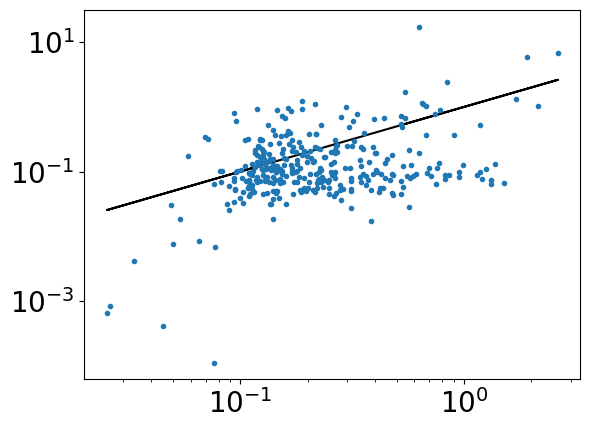

In [161]:
plt.loglog(traj.theta[:,0],traj.theta[:,0],'k');
plt.loglog(traj.theta[:,0],traj_fix.theta[:,0],'.');

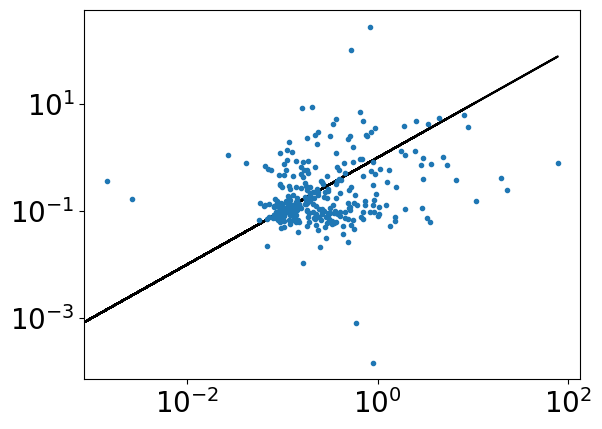

In [162]:
plt.loglog(traj.theta[:,2],traj.theta[:,2],'k');
plt.loglog(traj.theta[:,2],traj_fix.theta[:,2],'.');

[Text(0, 0, 'α0'), Text(1, 0, 'α1'), Text(2, 0, 'α2')]

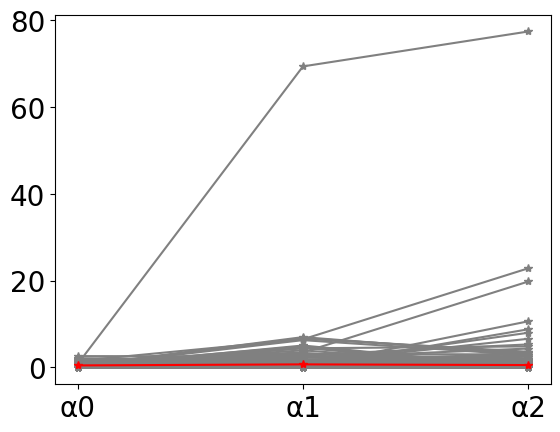

In [163]:
p=X.shape[1]
fig,ax = plt.subplots(1,1)
for j in range(p):
    ax.plot(traj.theta[j,[0,1,2]],'-*',color='gray')
for j in plot_idx:
    ax.plot(traj.theta[j,[0,1,2]],'-*',color='red')

x_label_list = ['α0', 'α1', 'α2']
ax.set_xticks([0,1,2])
ax.set_xticklabels(x_label_list)
#plt.yscale('log')

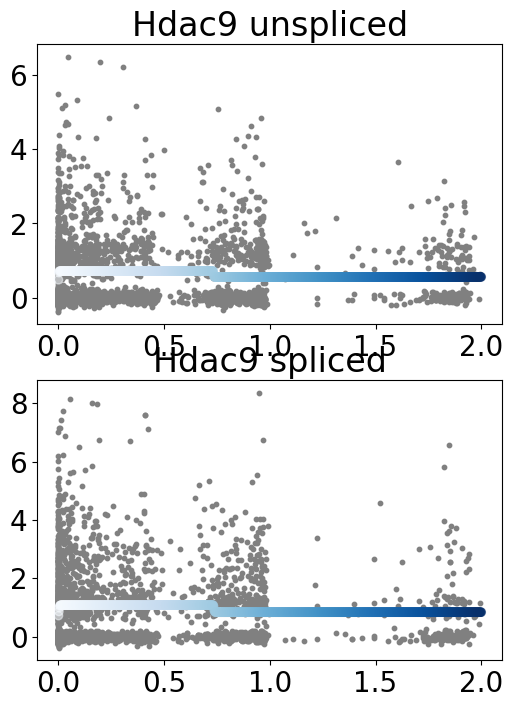

In [164]:
plot_y(traj,X=X/rd[:,None,None],idx=plot_idx,gene_name=fitted_genes);

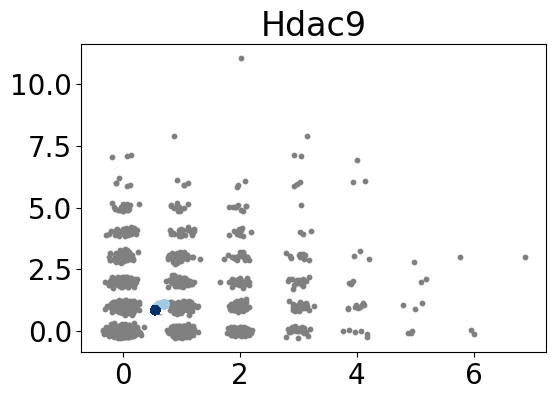

In [165]:
plot_phase(traj,X=X,idx=plot_idx,gene_name=fitted_genes);

In [166]:
alpha = traj.theta[:,:3]
DE_idx = np.where((alpha.max(axis=1)-alpha.min(axis=1))/np.sqrt(alpha.max(axis=1)) > 3)[0]
DE_idx

array([132, 160, 164, 206])

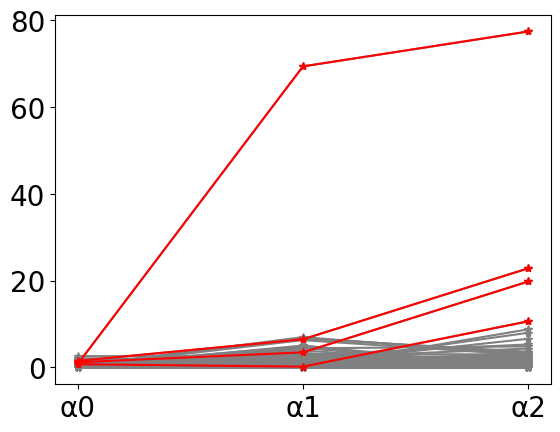

In [167]:
p=X.shape[1]
fig,ax = plt.subplots(1,1)
for j in range(p):
    ax.plot(traj.theta[j,[0,1,2]],'-*',color='gray')
for j in DE_idx:
    ax.plot(traj.theta[j,[0,1,2]],'-*',color='red')

x_label_list = ['α0', 'α1', 'α2']
ax.set_xticks([0,1,2]);
ax.set_xticklabels(x_label_list);
#plt.yscale('log')

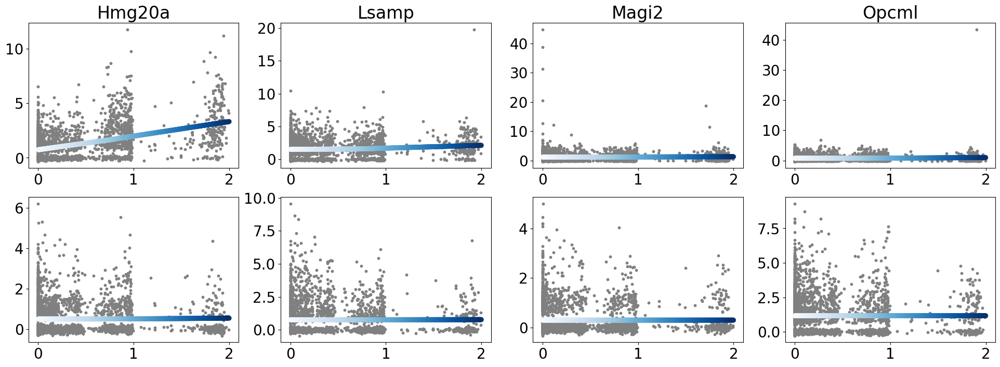

In [168]:
plot_y(traj,X=X/rd[:,None,None],idx=DE_idx,gene_name=fitted_genes);

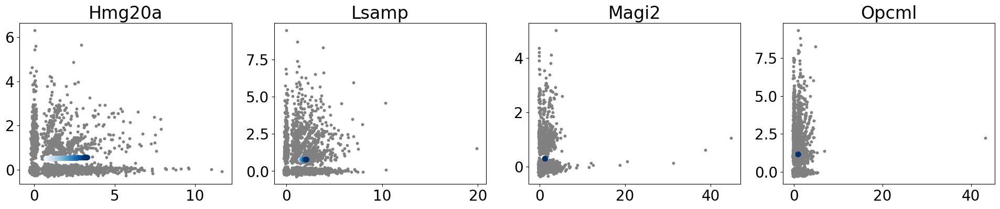

In [169]:
plot_phase(traj,X=X/rd[:,None,None],idx=DE_idx,gene_name=fitted_genes);

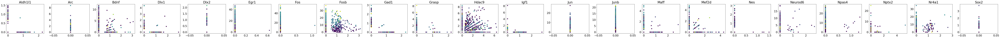

In [170]:
plot_marker_genes = marker_genes
fig,ax = plt.subplots(1,len(plot_marker_genes),figsize=(6*len(plot_marker_genes),4))
for i,gene in enumerate(plot_marker_genes):
    j = np.where(adata.var_names == gene)[0][0]
    ax[i].set_title(gene)
    ax[i].scatter(adata.layers["unspliced"].toarray()[:,j]/rd,adata.layers["spliced"].toarray()[:,j]/rd,c=traj.Q[:,0]@traj.t)

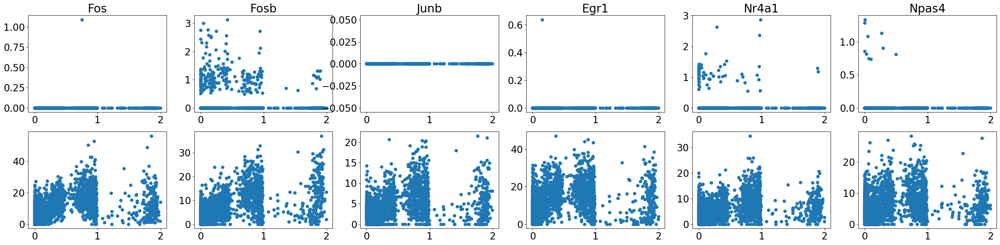

In [171]:
plot_marker_genes = IEG
fig,ax = plt.subplots(2,len(plot_marker_genes),figsize=(6*len(plot_marker_genes),8))
for i,gene in enumerate(plot_marker_genes):
    j = np.where(adata.var_names == gene)[0][0]
    ax[0,i].set_title(gene)
    ax[0,i].scatter(traj.Q[:,0]@traj.t,adata.layers["unspliced"].toarray()[:,j]/rd)
    ax[1,i].scatter(traj.Q[:,0]@traj.t,adata.layers["spliced"].toarray()[:,j]/rd)

/home/mffang/miniconda3/envs/python_3.8/lib/python3.8/site-packages/scipy/interpolate/_fitpack2.py:298: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


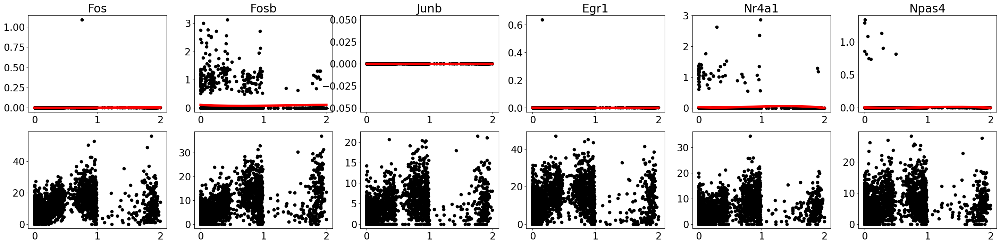

In [172]:
plot_marker_genes = IEG

t_hat = traj.Q[:,0]@traj.t
cell_order = np.argsort(t_hat)
x = t_hat[cell_order]
x_smooth = np.linspace(x.min(), x.max(), num=10)  # Generate a uniform grid for plotting    
    
fig,ax = plt.subplots(2,len(plot_marker_genes),figsize=(6*len(plot_marker_genes),8))
for i in range(len(plot_marker_genes)):
    j = np.where(adata.var_names == plot_marker_genes[i])[0][0]
    y = adata.layers["unspliced"].toarray()[:,j]
    u_spline = UnivariateSpline(x, y, s=len(x)*1)
    y_smooth = u_spline(x_smooth)
    ax[0,i].plot(x_smooth, y_smooth, label='Smoothed Function',c='r',linewidth=5)
    ax[0,i].set_title(plot_marker_genes[i])
    ax[0,i].scatter(traj.Q[:,0]@traj.t,adata.layers["unspliced"].toarray()[:,j]/rd,color='k')
    
    z = adata.layers["spliced"].toarray()[:,j]
    s_spline = UnivariateSpline(x, z, s=len(x)*10)
    z_smooth = s_spline(x_smooth)
    ax[1,i].scatter(traj.Q[:,0]@traj.t,adata.layers["spliced"].toarray()[:,j]/rd,color='k')
    ax[1,i].plot(x_smooth, z_smooth, label='Smoothed Function',c='r',linewidth=5)

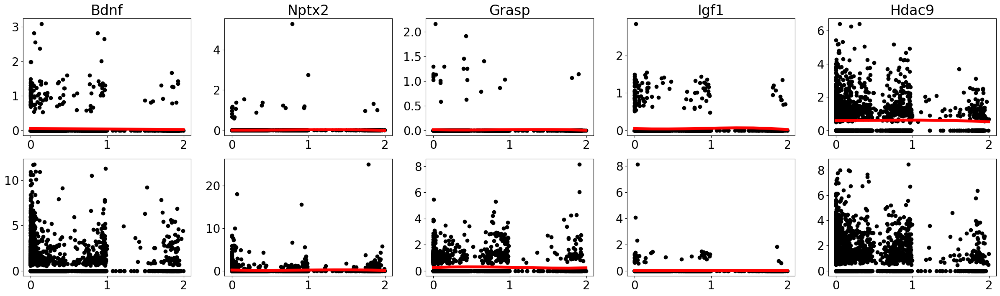

In [173]:
plot_marker_genes = LRG

t_hat = traj.Q[:,0]@traj.t
cell_order = np.argsort(t_hat)
x = t_hat[cell_order]
x_smooth = np.linspace(x.min(), x.max(), num=10)  # Generate a uniform grid for plotting    
    
fig,ax = plt.subplots(2,len(plot_marker_genes),figsize=(6*len(plot_marker_genes),8))
for i in range(len(plot_marker_genes)):
    j = np.where(adata.var_names == plot_marker_genes[i])[0][0]
    y = adata.layers["unspliced"].toarray()[:,j]
    u_spline = UnivariateSpline(x, y, s=len(x)*1)
    y_smooth = u_spline(x_smooth)
    ax[0,i].plot(x_smooth, y_smooth, label='Smoothed Function',c='r',linewidth=5)
    ax[0,i].set_title(plot_marker_genes[i])
    ax[0,i].scatter(traj.Q[:,0]@traj.t,adata.layers["unspliced"].toarray()[:,j]/rd,color='k')
    
    z = adata.layers["spliced"].toarray()[:,j] 
    s_spline = UnivariateSpline(x, z, s=len(x)*1)
    z_smooth = s_spline(x_smooth)
    ax[1,i].scatter(traj.Q[:,0]@traj.t,adata.layers["spliced"].toarray()[:,j]/rd,color='k')
    ax[1,i].plot(x_smooth, z_smooth, label='Smoothed Function',c='r',linewidth=5)

In [174]:
#from scipy.spatial import distance

#S = data.X.toarray()
#dist = distance.cdist(S, S, 'minkowski', p=1.)

#order = np.argsort(data.obs["t_hat"])
#sorted_dist = dist[order,:][:,order]
#plt.imshow(sorted_dist,aspect="auto");

#order = np.argsort(data.obs["celltype"])
#sorted_dist = dist[order,:][:,order]
#plt.imshow(sorted_dist,aspect="auto");

## Random starts without prior

/tmp/ipykernel_3279734/2484721257.py:3: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  im=ax.scatter(x_pca[:,0],x_pca[:,1],c='gray',cmap=cmap_y,s=10);


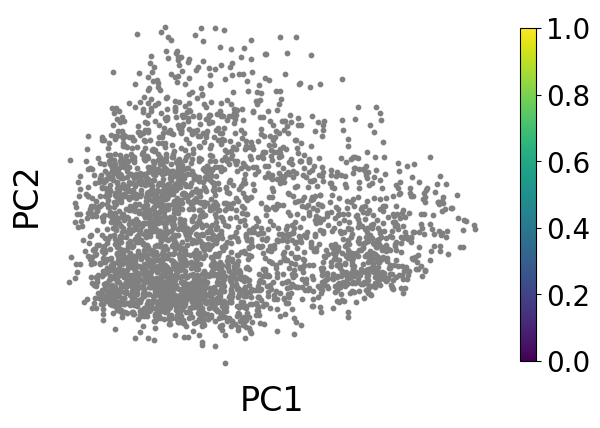

In [175]:
cmap_y = cmr.get_sub_cmap('Blues', 0.2, 1)
fig, ax = plt.subplots(1,1)
im=ax.scatter(x_pca[:,0],x_pca[:,1],c='gray',s=10);
ax.set_xlabel('PC1',fontsize=24)
ax.set_ylabel('PC2',fontsize=24)
ax.set_frame_on(False)
plt.xticks([]);
plt.yticks([]);
plt.colorbar(im,fraction=0.05, shrink =0.9) # adding the colobar on the right

In [176]:
from multiprocessing import Pool

tau = (0,1,2)
topo = np.array([[0,1,2]])
Input_args = []
def fit_wrapper(seed):
    traj = Trajectory(topo, tau, model="two_species_ss", verbose=0)
    traj = traj.fit(X,m=100,n_init=1,fit_tau=True,params=traj_params,perm_theta=False,epoch=100,parallel=False,n_threads=1,seed=seed)
    return traj
    
for seed in range(100):
    Input_args.append([seed])
            
with Pool(20) as pool:      
    trajs = pool.starmap(fit_wrapper, Input_args, chunksize=1)

Text(0.5, 1.0, 'Random initialiazation')

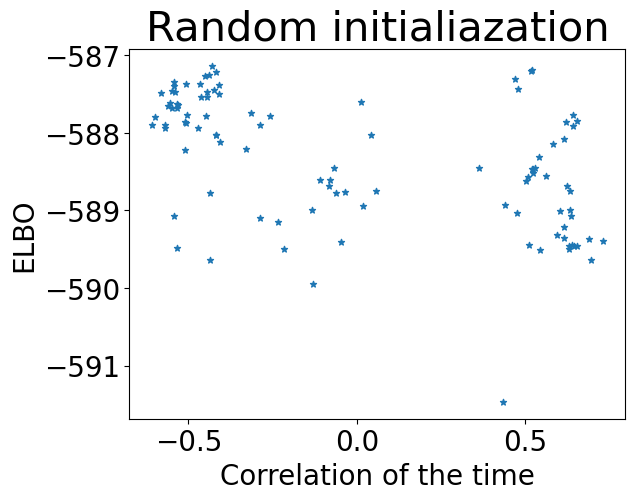

In [177]:
corrs = []
elbos = []

right_t = adata.obs.time
for traj in trajs:
    t_hat = traj.Q[:,0] @ traj.t
    corrs.append(pearsonr(right_t,t_hat)[0])
    elbos.append( traj.elbos[np.argmax([traj.elbos[i][-1] for i in range(len(traj.elbos))])][-1] )
plt.scatter(corrs,elbos,s=20,marker='*')
plt.xlabel('Correlation of the time',fontsize=20)
plt.ylabel('ELBO',fontsize=20)
plt.title('Random initialiazation',fontsize=30)

## Random starts with prior

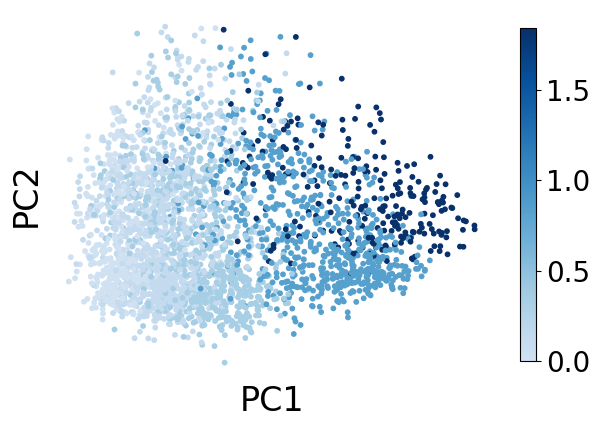

In [178]:
cmap_y = cmr.get_sub_cmap('Blues', 0.2, 1)
fig, ax = plt.subplots(1,1)
im=ax.scatter(x_pca[:,0],x_pca[:,1],c=(Q0.sum(1))@(np.linspace(0,2,m).reshape((-1,1))),cmap=cmap_y,s=10);
ax.set_xlabel('PC1',fontsize=24)
ax.set_ylabel('PC2',fontsize=24)
ax.set_frame_on(False)
plt.xticks([]);
plt.yticks([]);
plt.colorbar(im,fraction=0.05, shrink =0.9) # adding the colobar on the right

In [179]:
from multiprocessing import Pool

tau = (0,1,2)
topo = np.array([[0,1,2]])
Input_args = []
def fit_wrapper(seed):
    traj = Trajectory(topo, tau, model="two_species_ss", verbose=0)
    traj = traj.fit(X,m=100,n_init=1,fit_tau=True,params=traj_params,prior=Q0,perm_theta=False,epoch=100,parallel=False,n_threads=1,seed=seed)
    return traj
    
for seed in range(100):
    Input_args.append([seed])
            
with Pool(20) as pool:      
    trajs_prior = pool.starmap(fit_wrapper, Input_args, chunksize=1)

Text(0.5, 1.0, 'Random initialiazation')

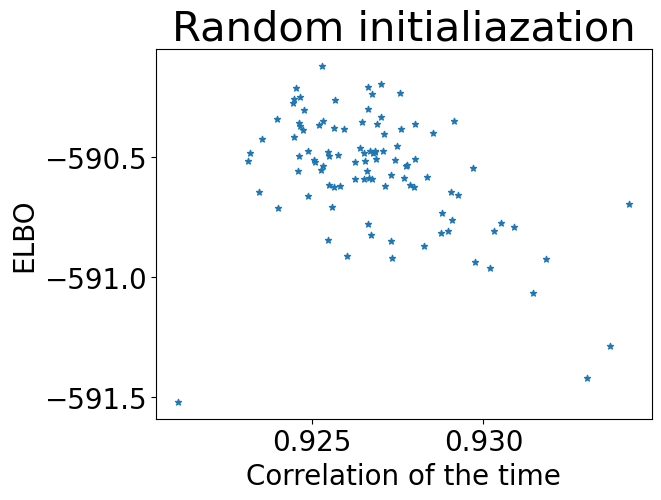

In [180]:
corrs = []
elbos = []

right_t = adata.obs.time
for traj in trajs_prior:
    t_hat = traj.Q[:,0] @ traj.t
    corrs.append(pearsonr(right_t,t_hat)[0])
    elbos.append( traj.elbos[np.argmax([traj.elbos[i][-1] for i in range(len(traj.elbos))])][-1] )
plt.scatter(corrs,elbos,s=20,marker='*')
plt.xlabel('Correlation of the time',fontsize=20)
plt.ylabel('ELBO',fontsize=20)
plt.title('Random initialiazation',fontsize=30)

In [181]:
import pickle 

with open('results/Erythoid.pickle', 'wb') as f:
    # Pickle the 'data' dictionary using the highest protocol available.
    data = {'traj_fix':traj_fix,'traj_prior':traj_prior,'traj_ws':traj_ws,'trajs':trajs,'trajs_prior':trajs_prior}
    pickle.dump(data, f, pickle.HIGHEST_PROTOCOL)

In [196]:
traj = trajs_prior[np.argmax(elbos)]
np.max(elbos)

-590.122030836574

[0.         0.73300061 2.        ]


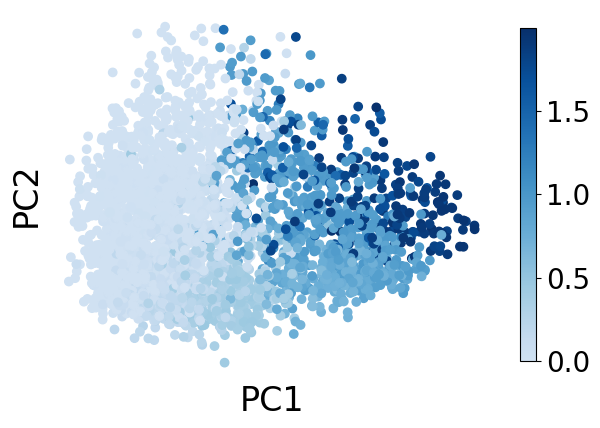

In [197]:
print(traj.tau)
cmap_y = cmr.get_sub_cmap('Blues', 0.2, 1)
fig, ax = plt.subplots(1,1)
im=ax.scatter(x_pca[:,0],x_pca[:,1],c=traj.Q[:,0]@traj.t,cmap=cmap_y);
ax.set_xlabel('PC1',fontsize=24)
ax.set_ylabel('PC2',fontsize=24)
ax.set_frame_on(False)
plt.xticks([]);
plt.yticks([]);
plt.colorbar(im,fraction=0.05, shrink =0.9) # adding the colobar on the right

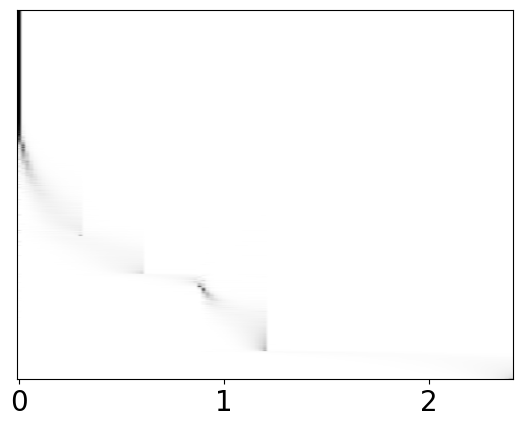

In [198]:
ax = plot_t(traj,l=0,order_cells=True)
x_label_list = ['0', '1', '2']
ax.set_xticks([0,50,100])
ax.set_xticklabels(x_label_list);
ax.set_yticks([]);

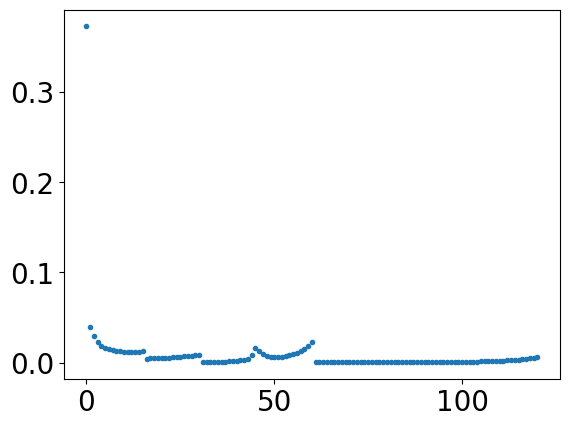

In [199]:
plt.plot(traj.Q.sum((0,1))/traj.Q.sum(),'.')

0.0
0.055549335931242616
0.18843131737964405
0.7794556085059186
1.6774103606086679


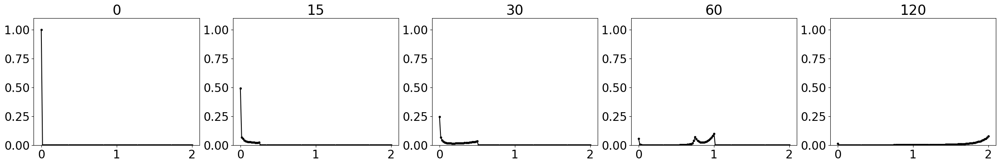

In [200]:
fig, ax = plt.subplots(1,len(Clusters),figsize=(6*len(Clusters),4))
for i,stage in enumerate(Clusters):
    idx = clusters.isin([stage])
    ax[i].plot(traj.t,traj.Q[idx,0].mean(0),'k.-')
    ax[i].set_title(stage)
    ax[i].set_ylim((0,1.1))
    print((traj.Q[idx,0]@traj.t).mean())

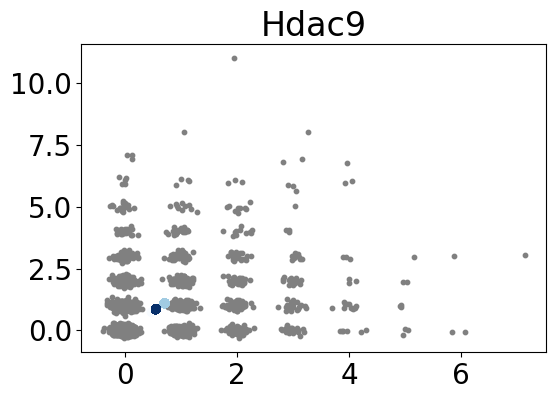

In [201]:
plot_phase(traj,idx=plot_idx,gene_name=fitted_genes);

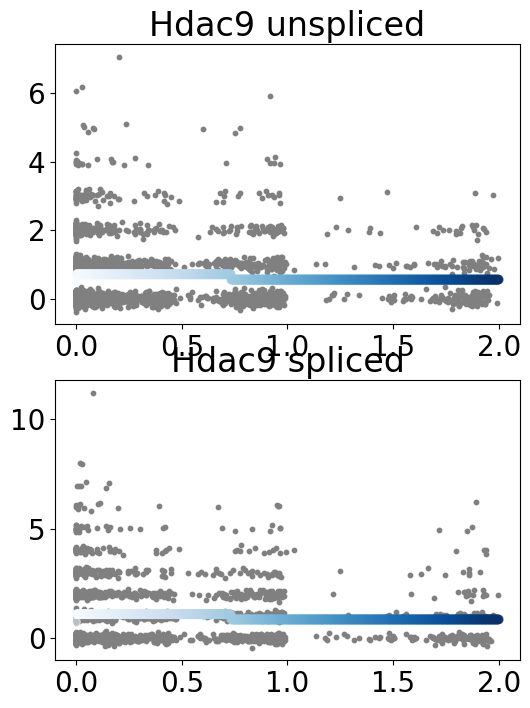

In [202]:
plot_y(traj,idx=plot_idx,gene_name=fitted_genes);

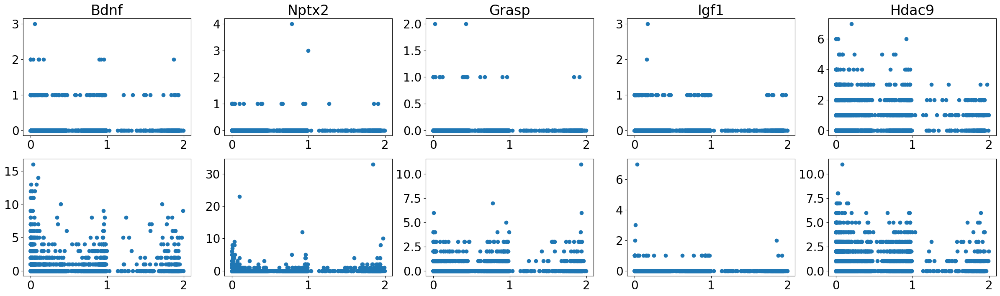

In [203]:
fig,ax = plt.subplots(2,len(plot_marker_genes),figsize=(6*len(plot_marker_genes),8))
for i,gene in enumerate(plot_marker_genes):
    j = np.where(adata.var_names == gene)[0][0]
    ax[0,i].set_title(gene)
    ax[0,i].scatter(traj.Q[:,0]@traj.t,adata.layers["unspliced"].toarray()[:,j])
    ax[1,i].scatter(traj.Q[:,0]@traj.t,adata.layers["spliced"].toarray()[:,j])

[Text(0, 0, 'α0'), Text(1, 0, 'α1'), Text(2, 0, 'α2')]

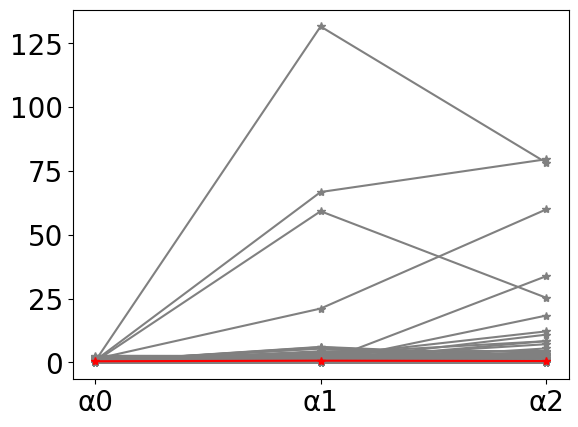

In [204]:
p=X.shape[1]
fig,ax = plt.subplots(1,1)
for j in range(p):
    ax.plot(traj.theta[j,[0,1,2]],'-*',color='gray')
for j in plot_idx:
    ax.plot(traj.theta[j,[0,1,2]],'-*',color='red')

x_label_list = ['α0', 'α1', 'α2']
ax.set_xticks([0,1,2])
ax.set_xticklabels(x_label_list)
#plt.yscale('log')

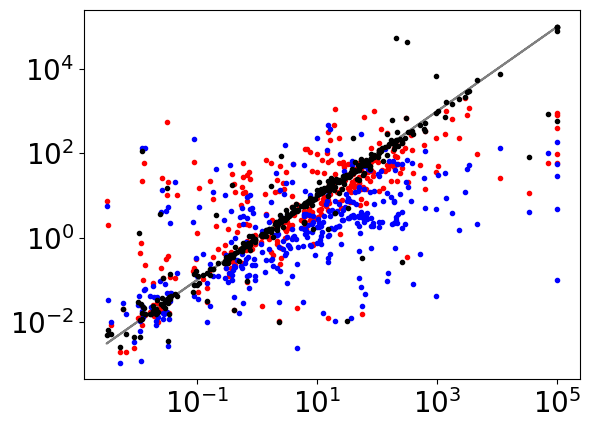

In [205]:
plt.loglog(traj.theta[:,[-2]],traj.theta[:,[-2]],'gray');
plt.loglog(traj.theta[:,[-2]],traj_ws.theta[:,[-2]],'r.',label=CCC(traj.theta[:,-2],traj_ws.theta[:,-2]));
plt.loglog(traj.theta[:,[-2]],traj_fix.theta[:,[-2]],'b.',label=CCC(traj.theta[:,-2],traj_fix.theta[:,-2]));
plt.loglog(traj.theta[:,[-2]],traj_prior.theta[:,[-2]],'k.',label=CCC(traj.theta[:,-2],traj_prior.theta[:,-2]));

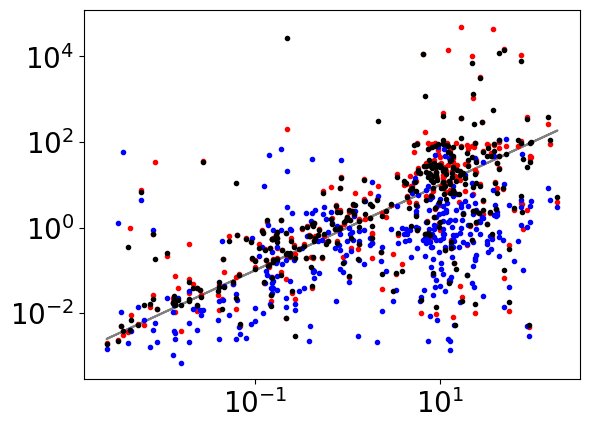

In [206]:
plt.loglog(traj_ws.theta[:,-1],traj_ws.theta[:,[-1]],'gray');
plt.loglog(traj_ws.theta[:,[-1]],traj.theta[:,[-1]],'r.',label=CCC(traj.theta[:,-1],traj_ws.theta[:,-1]));
plt.loglog(traj_ws.theta[:,[-1]],traj_fix.theta[:,[-1]],'b.',label=CCC(traj.theta[:,-1],traj_fix.theta[:,-1]));
plt.loglog(traj_ws.theta[:,[-1]],traj_prior.theta[:,[-1]],'k.',label=CCC(traj.theta[:,-1],traj_prior.theta[:,-1]));
#plt.legend()